## Кожин Асан
## telegram:@tioplon

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.experimental.AUTOTUNE

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


В качестве своей задачи использую свой датасет. Датасет собирался из поиска bing и аугментировался поворотами с помощью 3 python скриптов. Они тоже есть в архиве(download.py, resize.py, augment.py).
Фото бабочек 4 видов из 2 семейств:
1. Aglais Io и Vanessa Atalanta
2. Aporia Leucodice и Delias Eucharis

Я перекрашиваю бабочек из одного вида в другой.

В процессе экспереминтирования понял что 2-вариант лучше работает. Возможно на первом слишком сложный узор.

Тестовый датасет собран вручную и состоит из всего 3 картинок на каждую бабочку. Приходилось искать бабочек по другим именам и сравнивать есть ли такие в датасете.

In [ ]:
!cp /gdrive/MyDrive/models/butterfly_dataset2.zip /content/data.zip

In [ ]:
!unzip /content/data.zip 

Archive:  /content/data.zip
   creating: butterfly_dataset/
   creating: butterfly_dataset/aglais_io/
  inflating: butterfly_dataset/aglais_io/Image_1.jpg  
  inflating: butterfly_dataset/aglais_io/Image_10.jpg  
  inflating: butterfly_dataset/aglais_io/Image_100.jpg  
  inflating: butterfly_dataset/aglais_io/Image_100_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_101.jpg  
  inflating: butterfly_dataset/aglais_io/Image_101_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_102.jpg  
  inflating: butterfly_dataset/aglais_io/Image_102_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_104.jpg  
  inflating: butterfly_dataset/aglais_io/Image_104_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_105.jpg  
  inflating: butterfly_dataset/aglais_io/Image_105_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_10_r.jpg  
  inflating: butterfly_dataset/aglais_io/Image_11.jpg  
  inflating: butterfly_dataset/aglais_io/Image_112.jpg  
  inflating: butterfly_dataset/aglai

In [ ]:
PATH = '/content/butterfly_dataset/'

In [ ]:
BATCH_SIZE = 1 #Как в статье
IMG_HEIGHT, IMG_WIDTH = 256, 256

In [ ]:
def load(img_path):
  image = tf.io.read_file(img_path)
  image = tf.image.decode_jpeg(image)
  image = tf.cast(image, tf.float32)

  return image

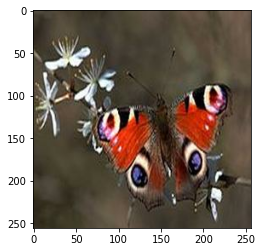

In [ ]:
img = load('/content/butterfly_dataset/aglais_io/Image_1.jpg')
plt.figure()
plt.imshow(img/255.0)

In [ ]:
def resize(img, height=256, width=256):
  img = tf.image.resize(img, [height, width],
                             method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return img

In [ ]:
@tf.function()
def preprocess(img):
  img = resize(img, height=286, width=286)
  cropped_image = tf.image.random_crop(img, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  img = (cropped_image / 127.5) - 1
  if tf.random.uniform(()) > 0.5:
    img = tf.image.flip_left_right(img)
  return img

In [ ]:
def load_image_train(image_file):
  img = load(image_file)
  return preprocess(img)


def load_image_test(image_file):
  img = load(image_file)
  img = resize(img)
  img = (img / 127.5) - 1
  return img

In [ ]:
trainA_dataset = tf.data.Dataset.list_files(PATH+'/aporia_leucodice/*.jpg')
trainA_dataset = trainA_dataset.map(load_image_train,
                                  num_parallel_calls=autotune)
trainA_dataset = trainA_dataset.batch(BATCH_SIZE)

trainB_dataset = tf.data.Dataset.list_files(PATH+'/delias_eucharis/*.jpg')
trainB_dataset = trainB_dataset.map(load_image_train,
                                  num_parallel_calls=autotune)
trainB_dataset = trainB_dataset.batch(BATCH_SIZE)

In [ ]:
testA_dataset = tf.data.Dataset.list_files(PATH+'/test_aporia_leucodice/*.jpg')
testA_dataset = testA_dataset.map(load_image_test,
                                  num_parallel_calls=autotune)
testA_dataset = testA_dataset.batch(BATCH_SIZE)

testB_dataset = tf.data.Dataset.list_files(PATH+'/test_delias_eucharis/*.jpg')
testB_dataset = testB_dataset.map(load_image_test,
                                  num_parallel_calls=autotune)
testB_dataset = testB_dataset.batch(BATCH_SIZE)

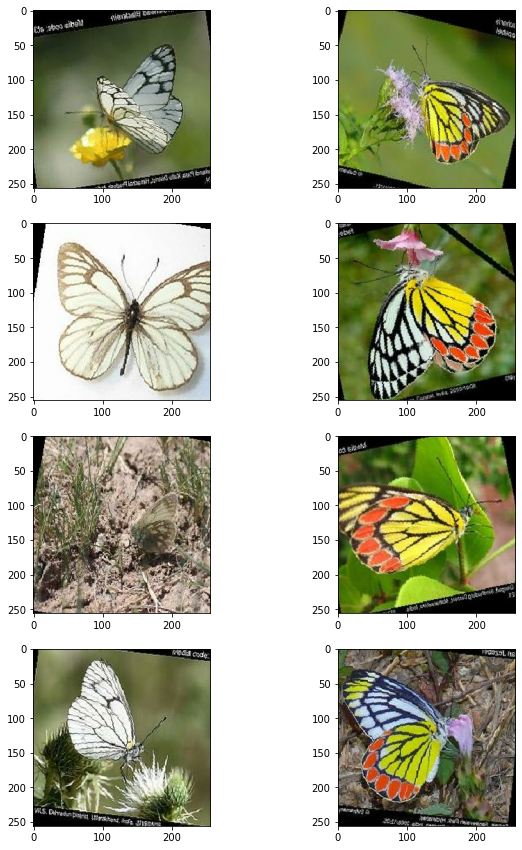

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(tf.data.Dataset.zip((trainA_dataset.take(4), trainB_dataset.take(4)))):
    white = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    color = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(white)
    ax[i, 1].imshow(color)
plt.show()

Архитектура неронных сетей такая как и в решенной задаче.

In [ ]:
#Код с https://keras.io/examples/generative/cyclegan/

kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.
    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.
    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

In [ ]:
class CycleGAN(keras.Model):
  def __init__(self):
    super(CycleGAN, self).__init__()

    self.input_img_size = (256, 256, 3)

    self.g_AB = self.get_generator(name="generator_AB")
    self.g_BA = self.get_generator(name="generator_BA")

    self.disc_A = self.get_discriminator(name="discriminator_A")
    self.disc_B = self.get_discriminator(name="discriminator_B")


  def compile(self,
              opt_g_AB,
              opt_g_BA,
              opt_disc_A,
              opt_disc_B,
              ):
    super(CycleGAN, self).compile()

    def generator_loss_fn(fake, loss_fn=keras.losses.MeanSquaredError()):
      fake_loss = loss_fn(tf.ones_like(fake), fake)
      return fake_loss

    def discriminator_loss_fn(real, fake, loss_fn=keras.losses.MeanSquaredError()):
      real_loss = loss_fn(tf.ones_like(real), real)
      fake_loss = loss_fn(tf.zeros_like(fake), fake)
      return 0.5 * (real_loss + fake_loss)

    self.g_AB_opt = opt_g_AB
    self.g_BA_opt = opt_g_BA
    self.disc_A_opt = opt_disc_A
    self.disc_B_opt = opt_disc_B

    self.gen_loss_fn = generator_loss_fn
    self.disc_loss_fn = discriminator_loss_fn
    self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
    self.identity_loss_fn = keras.losses.MeanAbsoluteError()

  def train_step(self, batch_data):
    #a is photos b is maps
    real_a, real_b = batch_data

    with tf.GradientTape(persistent=True) as tape:

      fake_b = self.g_AB(real_a, training=True)
      fake_a = self.g_BA(real_b, training=True)

      #ideally should be cycled to real
      cycled_a = self.g_BA(fake_b, training=True)
      cycled_b = self.g_AB(fake_a, training=True)

      same_a = self.g_BA(real_a, training=True)
      same_b = self.g_AB(real_b, training=True)

      disc_real_a = self.disc_A(real_a, training=True)
      disc_fake_a = self.disc_A(fake_a, training=True)

      disc_real_b = self.disc_B(real_b, training=True)
      disc_fake_b = self.disc_B(fake_b, training=True)

      gen_AB_loss = self.gen_loss_fn(disc_fake_b)
      gen_BA_loss = self.gen_loss_fn(disc_fake_a)

      # Cycle loss for generators
      cycle_loss_AB = self.cycle_loss_fn(real_b, cycled_b) * 10.0
      cycle_loss_BA = self.cycle_loss_fn(real_a, cycled_a) * 10.0

      id_loss_AB = self.identity_loss_fn(real_b, same_b) * 10.0 * 0.5
      id_loss_BA = self.identity_loss_fn(real_a, same_a) * 10.0 * 0.5

      #generator total loss
      total_loss_AB = gen_AB_loss + cycle_loss_AB + id_loss_AB
      total_loss_BA = gen_BA_loss + cycle_loss_BA + id_loss_BA

      #Discriminators losses
      disc_A_loss = self.disc_loss_fn(disc_real_a, disc_fake_a)
      disc_B_loss = self.disc_loss_fn(disc_real_b, disc_fake_b)

    grads_AB = tape.gradient(total_loss_AB, self.g_AB.trainable_variables)
    grads_BA = tape.gradient(total_loss_BA, self.g_BA.trainable_variables)

    grads_disc_A = tape.gradient(disc_A_loss, self.disc_A.trainable_variables)
    grads_disc_B = tape.gradient(disc_B_loss, self.disc_B.trainable_variables)

    self.g_AB_opt.apply_gradients(zip(grads_AB, self.g_AB.trainable_variables))
    self.g_BA_opt.apply_gradients(zip(grads_BA, self.g_BA.trainable_variables))

    self.disc_A_opt.apply_gradients(zip(grads_disc_A, self.disc_A.trainable_variables))
    self.disc_B_opt.apply_gradients(zip(grads_disc_B, self.disc_B.trainable_variables))

    return {"AB_loss": total_loss_AB,
            "BA_loss": total_loss_BA,
            "Disc_A_loss": disc_A_loss,
            "Disc_B_loss": disc_B_loss}

  def get_generator(self,
                    filters=64,
                    num_downsampling_blocks=2,
                    num_residual_blocks=9,
                    num_upsample_blocks=2,
                    gamma_initializer=gamma_init,
                    name=None):
    input = layers.Input(shape=self.input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    #Downsampling
    x = downsample(x, filters=filters*2, activation=layers.Activation("relu"))
    x = downsample(x, filters=filters*4, activation=layers.Activation("relu"))

    for _ in range(num_residual_blocks):
      x = residual_block(x, activation=layers.Activation("relu"))

    x = upsample(x, filters=filters*4, activation=layers.Activation("relu"))
    x = upsample(x, filters=filters*2, activation=layers.Activation("relu"))

    x = ReflectionPadding2D(padding=(3,3))(x)
    out = layers.Activation("tanh")(layers.Conv2D(3, (7, 7), padding="valid")(x))

    return keras.models.Model(inputs=input, outputs=out, name=name)


  def get_discriminator(self, filters=64, kernel_initializer=kernel_init,
                        num_downsampling=3, name=None):
    #https://arxiv.org/pdf/1611.07004.pdf  - страница 16
    #                             C64-C128-C256-C512
    input = layers.Input(shape=self.input_img_size, name=name + "_img_input")
    x = layers.Conv2D(filters, (3, 3), strides=(1, 1), padding='same',
                      kernel_initializer=kernel_initializer)(input)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = downsample(x, filters=filters*2, activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4), strides=(2, 2))
    x = downsample(x, filters=filters*4, activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4), strides=(2, 2))
    x = downsample(x, filters=filters*8, activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4), strides=(1, 1))
    out = layers.Conv2D(1, (4, 4), strides=(1, 1), padding='same',
                        kernel_initializer=kernel_initializer)(x)
    
    return keras.models.Model(inputs=input, outputs=out, name=name)

In [ ]:
class ImageCallback(keras.callbacks.Callback):
  def __init__(self, num_img=4):
    self.num_img = num_img

  def on_epoch_end(self, epoch, logs=None):
    _, ax = plt.subplots(2, 4, figsize=(8, 8))
    for i, samples in enumerate(tf.data.Dataset.zip((trainA_dataset, trainB_dataset)).take(2)):
      label, real  = samples[1], samples[0]
      gen_label = cyclegan_model.g_AB(real)
      gen_real = cyclegan_model.g_BA(label)
      label = (((label[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
      gen_label = (((gen_label[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
      real = (((real[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
      gen_real = (((gen_real[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
      ax[i, 0].imshow(real)
      ax[i, 0].axis("off")
      ax[i, 1].imshow(gen_real)
      ax[i, 1].axis("off")
      ax[i, 2].imshow(label)
      ax[i, 2].axis("off")
      ax[i, 3].imshow(gen_label)
      ax[i, 3].axis("off")
    plt.show()

In [ ]:
plotter = ImageCallback()

checkpoints = "/content/model_checkpoints/cyclegan_aporia2delias_checkpoints100.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(filepath=checkpoints)

Сначала обучаю n эпох с lr=2e-4, затем меняю lr на linear decay.

In [ ]:
cyclegan_model = CycleGAN()
cyclegan_model.compile(keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5))

In [ ]:
linear_decay = tf.keras.optimizers.schedules.PolynomialDecay(
    2e-4,     # Base learning rate
    50,       # Epochs needed to decay
    end_learning_rate=0,
    power=1.0,
    cycle=False,
    name=None,
)

cyclegan_model = CycleGAN()
cyclegan_model.compile(keras.optimizers.Adam(learning_rate=linear_decay, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=linear_decay, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=linear_decay, beta_1=0.5),
                       keras.optimizers.Adam(learning_rate=linear_decay, beta_1=0.5))

In [ ]:
weight_file = "/content/model_checkpoints/cyclegan_aporia2delias_checkpoints.020"
cyclegan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

Weights loaded successfully


Epoch 1/50
232/232 [==============================] - 245s 851ms/step - AB_loss: 3.0885 - BA_loss: 2.4343 - Disc_A_loss: 0.1252 - Disc_B_loss: 0.1879


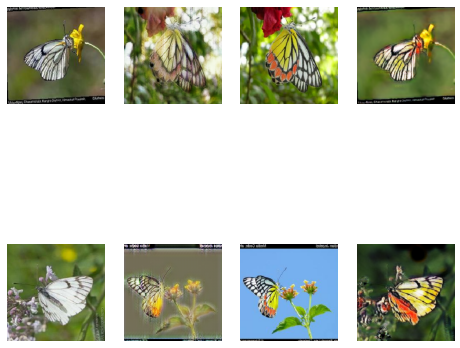

Epoch 2/50
232/232 [==============================] - 200s 861ms/step - AB_loss: 3.1248 - BA_loss: 2.4345 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1834


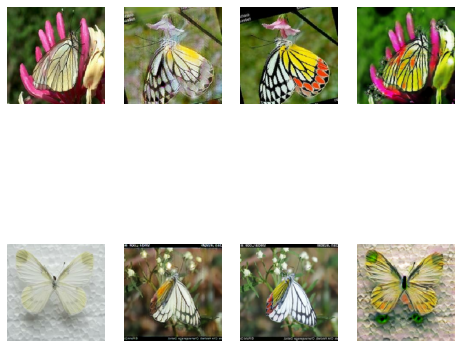

Epoch 3/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1108 - BA_loss: 2.4259 - Disc_A_loss: 0.1255 - Disc_B_loss: 0.1863


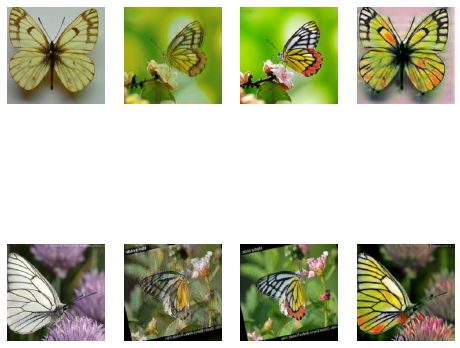

Epoch 4/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1397 - BA_loss: 2.4334 - Disc_A_loss: 0.1262 - Disc_B_loss: 0.1825


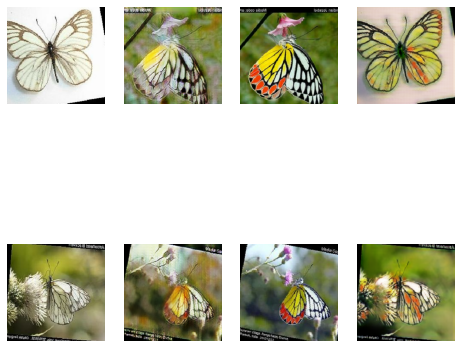

Epoch 5/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1122 - BA_loss: 2.4410 - Disc_A_loss: 0.1247 - Disc_B_loss: 0.1773


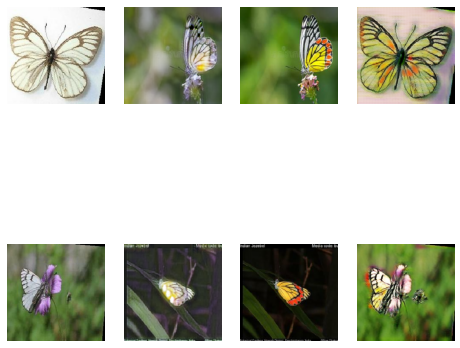

Epoch 6/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1522 - BA_loss: 2.4311 - Disc_A_loss: 0.1248 - Disc_B_loss: 0.1811


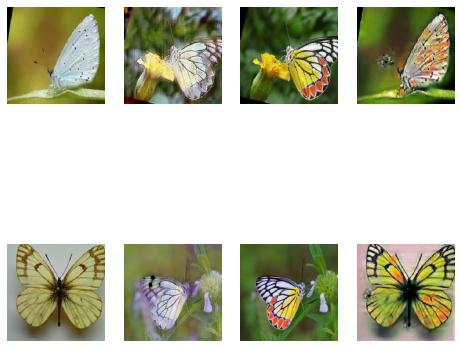

Epoch 7/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1214 - BA_loss: 2.4315 - Disc_A_loss: 0.1265 - Disc_B_loss: 0.1761


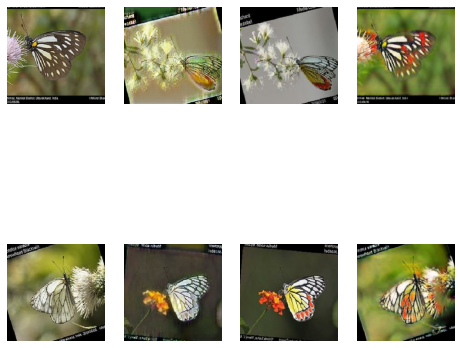

Epoch 8/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1307 - BA_loss: 2.4278 - Disc_A_loss: 0.1249 - Disc_B_loss: 0.1837


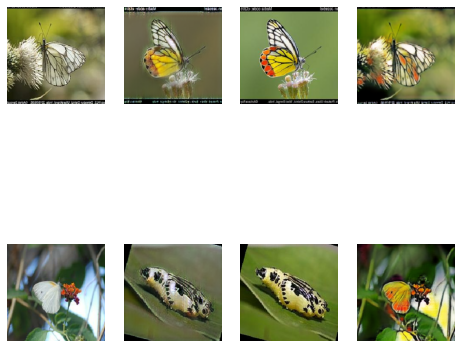

Epoch 9/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1211 - BA_loss: 2.4147 - Disc_A_loss: 0.1262 - Disc_B_loss: 0.1824


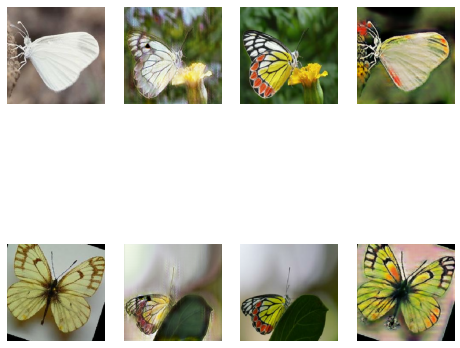

Epoch 10/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1317 - BA_loss: 2.4257 - Disc_A_loss: 0.1263 - Disc_B_loss: 0.1813


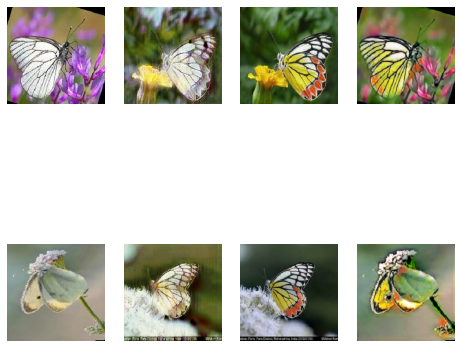

Epoch 11/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1685 - BA_loss: 2.4263 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1828


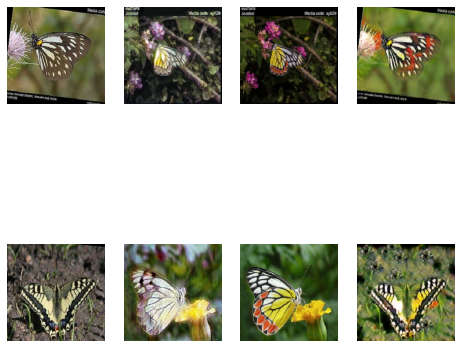

Epoch 12/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1433 - BA_loss: 2.4219 - Disc_A_loss: 0.1262 - Disc_B_loss: 0.1831


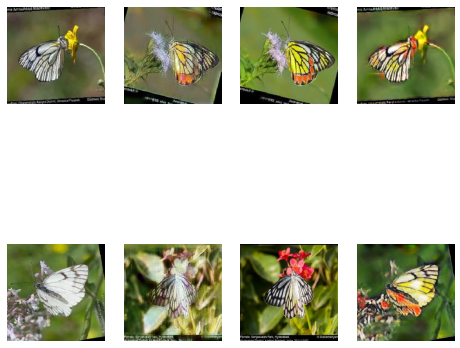

Epoch 13/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1392 - BA_loss: 2.4244 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1779


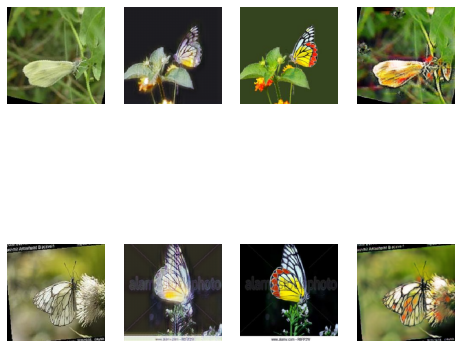

Epoch 14/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1345 - BA_loss: 2.4225 - Disc_A_loss: 0.1250 - Disc_B_loss: 0.1875


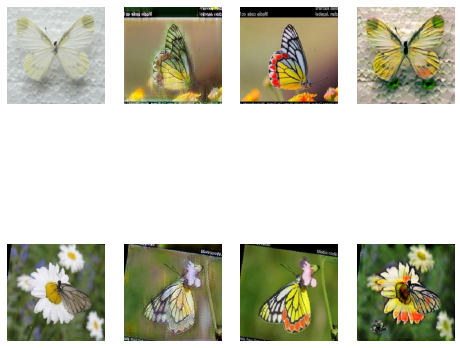

Epoch 15/50
232/232 [==============================] - 201s 866ms/step - AB_loss: 3.1238 - BA_loss: 2.4217 - Disc_A_loss: 0.1249 - Disc_B_loss: 0.1814


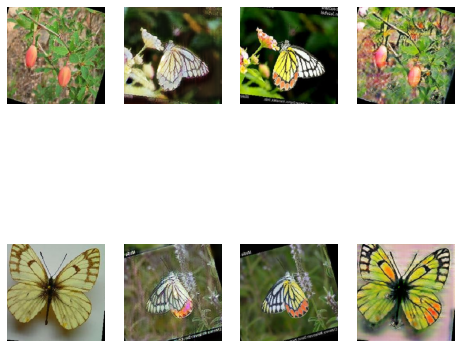

Epoch 16/50
232/232 [==============================] - 201s 866ms/step - AB_loss: 3.1383 - BA_loss: 2.4151 - Disc_A_loss: 0.1263 - Disc_B_loss: 0.1836


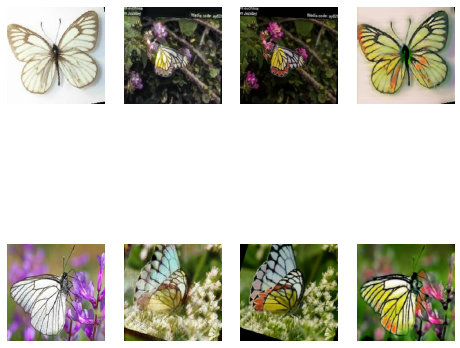

Epoch 17/50
232/232 [==============================] - 202s 869ms/step - AB_loss: 3.1126 - BA_loss: 2.4212 - Disc_A_loss: 0.1263 - Disc_B_loss: 0.1845


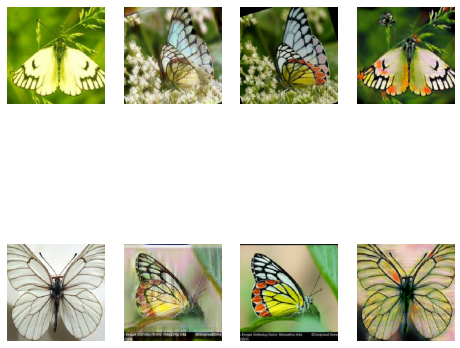

Epoch 18/50
232/232 [==============================] - 201s 867ms/step - AB_loss: 3.1004 - BA_loss: 2.4166 - Disc_A_loss: 0.1261 - Disc_B_loss: 0.1812


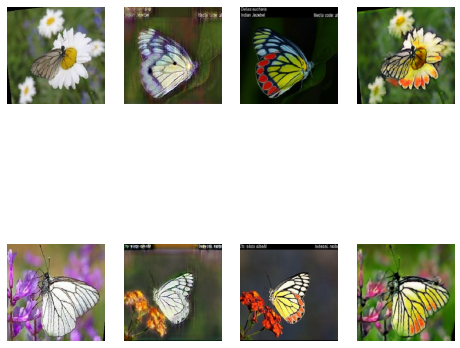

Epoch 19/50
232/232 [==============================] - 201s 868ms/step - AB_loss: 3.1508 - BA_loss: 2.4298 - Disc_A_loss: 0.1263 - Disc_B_loss: 0.1815


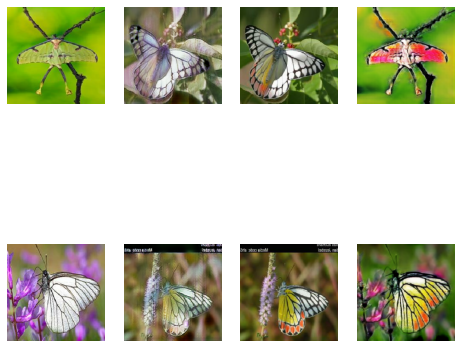

Epoch 20/50
232/232 [==============================] - 201s 867ms/step - AB_loss: 3.1471 - BA_loss: 2.4258 - Disc_A_loss: 0.1259 - Disc_B_loss: 0.1833


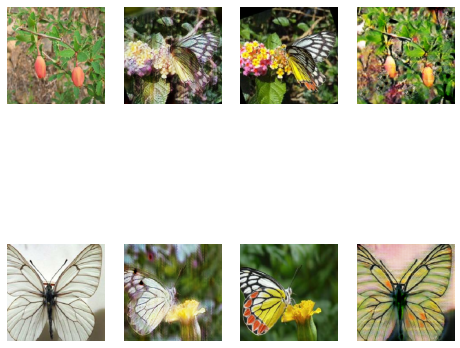

Epoch 21/50
232/232 [==============================] - 202s 869ms/step - AB_loss: 3.1188 - BA_loss: 2.4302 - Disc_A_loss: 0.1265 - Disc_B_loss: 0.1780


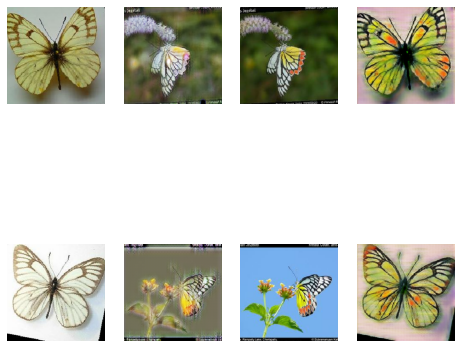

Epoch 22/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.0707 - BA_loss: 2.4195 - Disc_A_loss: 0.1257 - Disc_B_loss: 0.1838


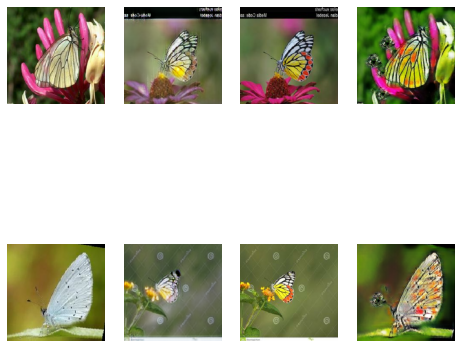

Epoch 23/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.0946 - BA_loss: 2.4140 - Disc_A_loss: 0.1276 - Disc_B_loss: 0.1828


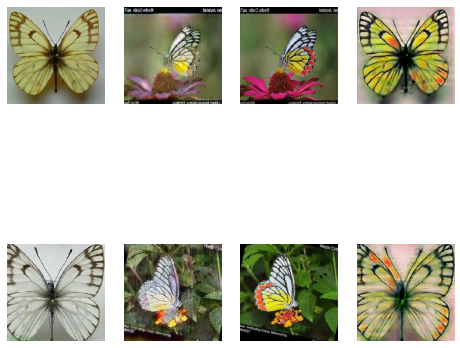

Epoch 24/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.0889 - BA_loss: 2.4290 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1802


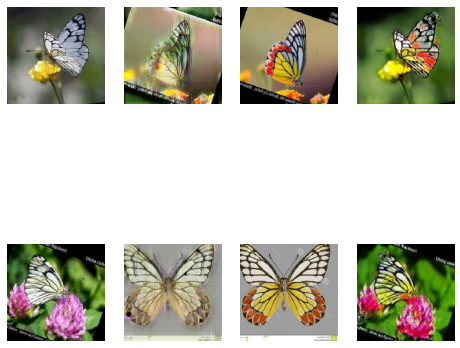

Epoch 25/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1170 - BA_loss: 2.4192 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1808


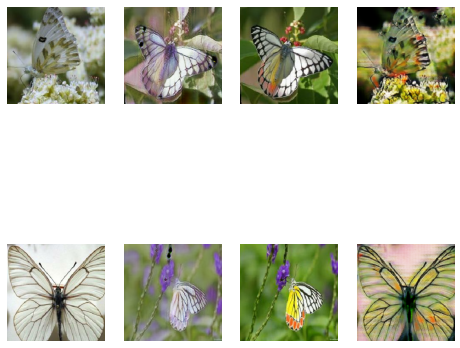

Epoch 26/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1130 - BA_loss: 2.4279 - Disc_A_loss: 0.1256 - Disc_B_loss: 0.1866


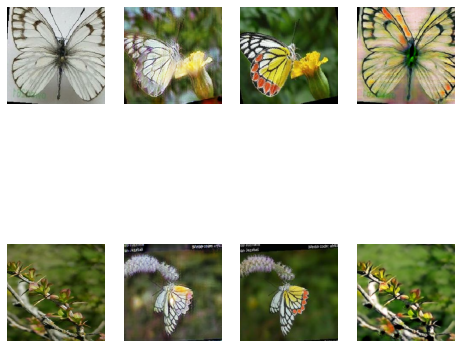

Epoch 27/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.0934 - BA_loss: 2.4322 - Disc_A_loss: 0.1261 - Disc_B_loss: 0.1826


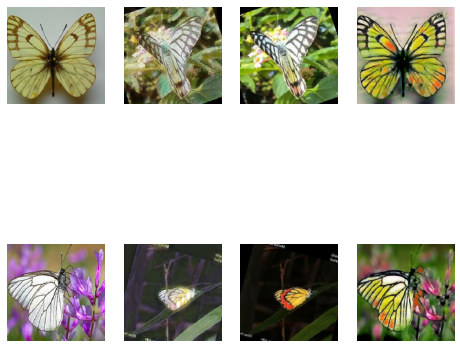

Epoch 28/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1129 - BA_loss: 2.4216 - Disc_A_loss: 0.1261 - Disc_B_loss: 0.1825


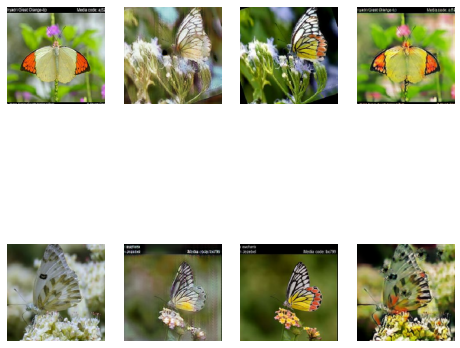

Epoch 29/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1106 - BA_loss: 2.4347 - Disc_A_loss: 0.1255 - Disc_B_loss: 0.1794


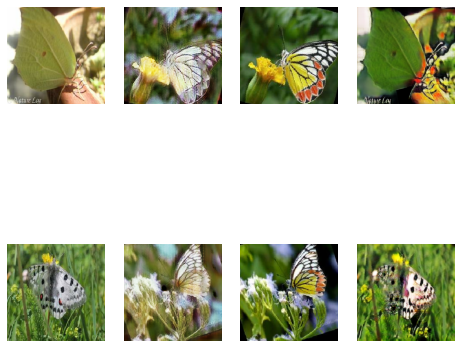

Epoch 30/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1269 - BA_loss: 2.4121 - Disc_A_loss: 0.1264 - Disc_B_loss: 0.1852


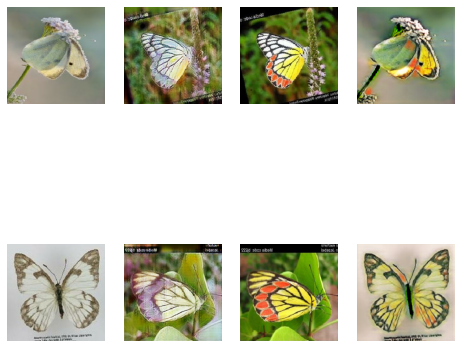

Epoch 31/50
232/232 [==============================] - 200s 861ms/step - AB_loss: 3.1452 - BA_loss: 2.4219 - Disc_A_loss: 0.1257 - Disc_B_loss: 0.1819


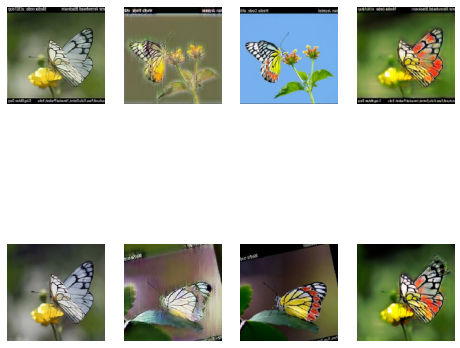

Epoch 32/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.0903 - BA_loss: 2.4299 - Disc_A_loss: 0.1275 - Disc_B_loss: 0.1837


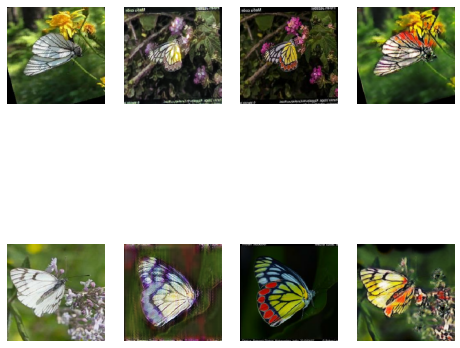

Epoch 33/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1206 - BA_loss: 2.4156 - Disc_A_loss: 0.1267 - Disc_B_loss: 0.1797


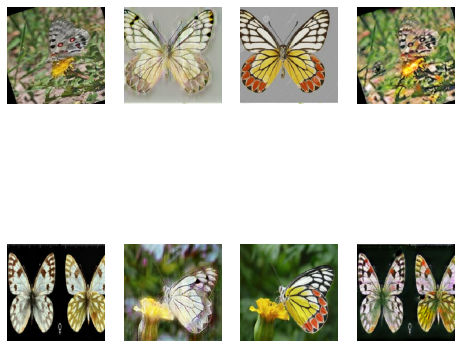

Epoch 34/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1325 - BA_loss: 2.4113 - Disc_A_loss: 0.1274 - Disc_B_loss: 0.1805


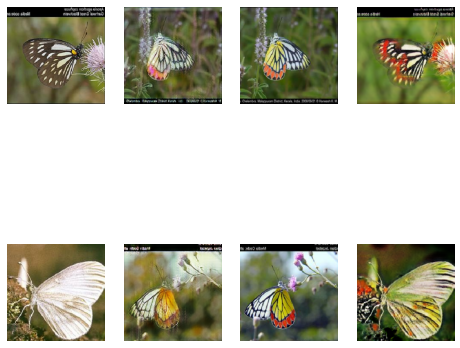

Epoch 35/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.0898 - BA_loss: 2.4273 - Disc_A_loss: 0.1260 - Disc_B_loss: 0.1836


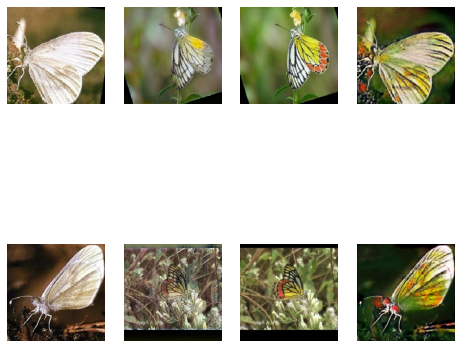

Epoch 36/50
232/232 [==============================] - 200s 862ms/step - AB_loss: 3.1308 - BA_loss: 2.4298 - Disc_A_loss: 0.1274 - Disc_B_loss: 0.1860


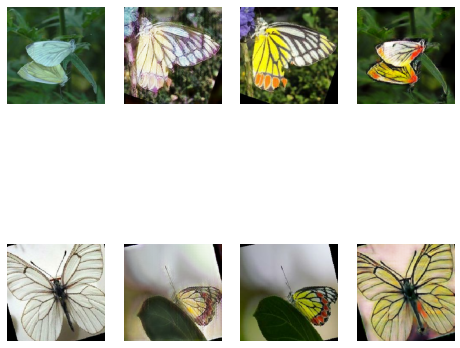

Epoch 37/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1355 - BA_loss: 2.4287 - Disc_A_loss: 0.1259 - Disc_B_loss: 0.1838


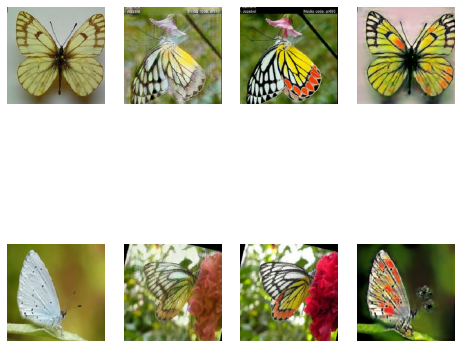

Epoch 38/50
232/232 [==============================] - 200s 864ms/step - AB_loss: 3.1339 - BA_loss: 2.4327 - Disc_A_loss: 0.1249 - Disc_B_loss: 0.1834


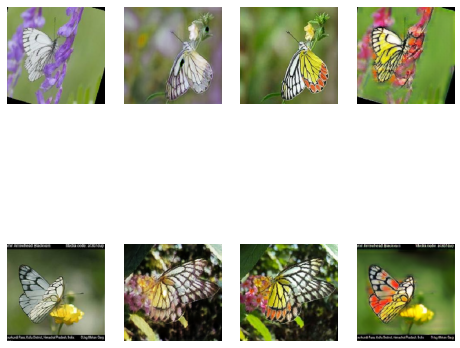

Epoch 39/50
232/232 [==============================] - 201s 866ms/step - AB_loss: 3.1409 - BA_loss: 2.4273 - Disc_A_loss: 0.1268 - Disc_B_loss: 0.1831


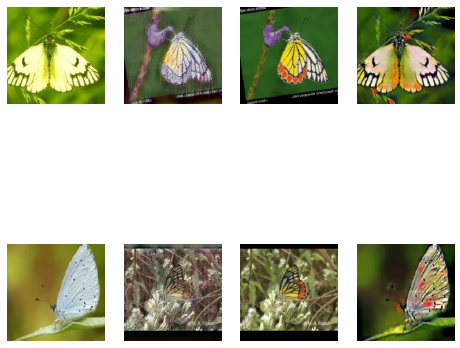

Epoch 40/50
232/232 [==============================] - 201s 867ms/step - AB_loss: 3.1377 - BA_loss: 2.4280 - Disc_A_loss: 0.1254 - Disc_B_loss: 0.1801


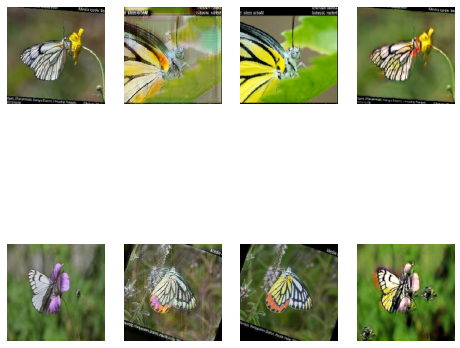

Epoch 41/50
232/232 [==============================] - 202s 868ms/step - AB_loss: 3.0881 - BA_loss: 2.4275 - Disc_A_loss: 0.1266 - Disc_B_loss: 0.1846


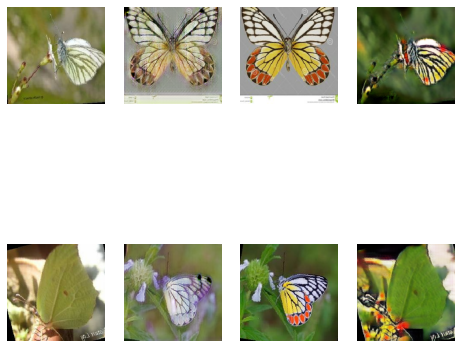

Epoch 42/50
232/232 [==============================] - 201s 868ms/step - AB_loss: 3.1347 - BA_loss: 2.4302 - Disc_A_loss: 0.1261 - Disc_B_loss: 0.1821


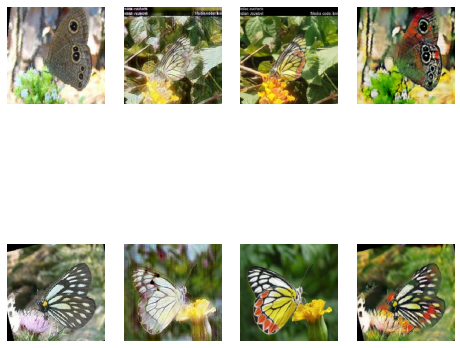

Epoch 43/50
232/232 [==============================] - 202s 868ms/step - AB_loss: 3.1048 - BA_loss: 2.4406 - Disc_A_loss: 0.1251 - Disc_B_loss: 0.1848


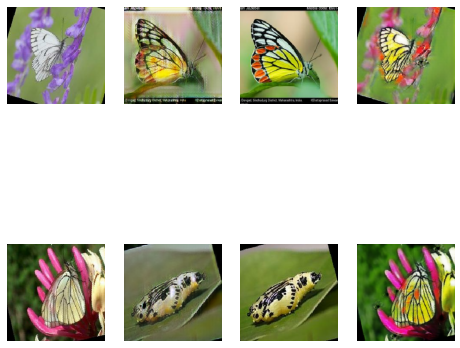

Epoch 44/50
232/232 [==============================] - 202s 869ms/step - AB_loss: 3.1270 - BA_loss: 2.4227 - Disc_A_loss: 0.1272 - Disc_B_loss: 0.1842


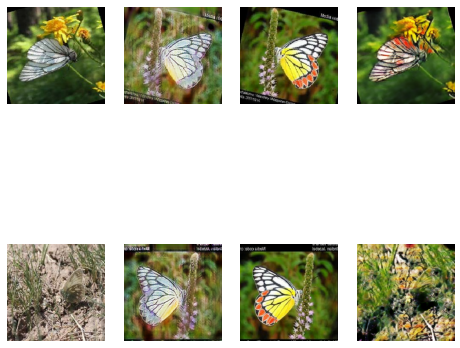

Epoch 45/50
232/232 [==============================] - 202s 869ms/step - AB_loss: 3.1201 - BA_loss: 2.4166 - Disc_A_loss: 0.1266 - Disc_B_loss: 0.1843


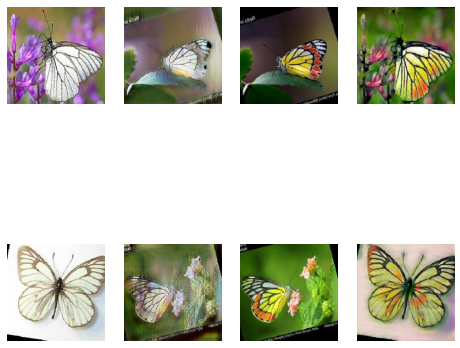

Epoch 46/50
232/232 [==============================] - 201s 868ms/step - AB_loss: 3.0974 - BA_loss: 2.4343 - Disc_A_loss: 0.1252 - Disc_B_loss: 0.1830


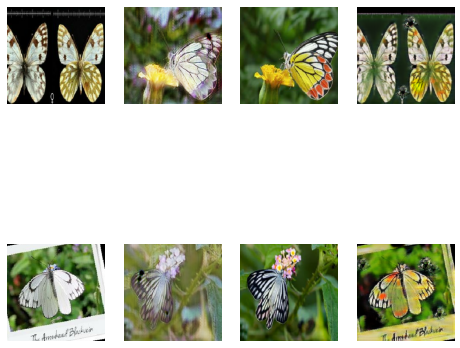

Epoch 47/50
232/232 [==============================] - 202s 871ms/step - AB_loss: 3.0862 - BA_loss: 2.4187 - Disc_A_loss: 0.1258 - Disc_B_loss: 0.1811


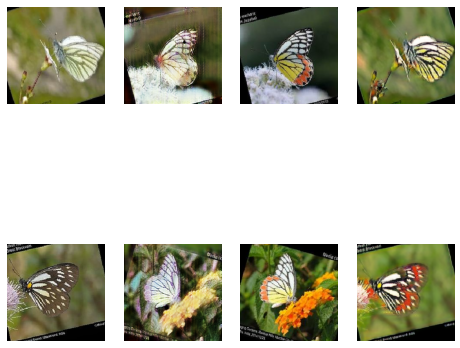

Epoch 48/50
232/232 [==============================] - 201s 866ms/step - AB_loss: 3.1072 - BA_loss: 2.4065 - Disc_A_loss: 0.1259 - Disc_B_loss: 0.1802


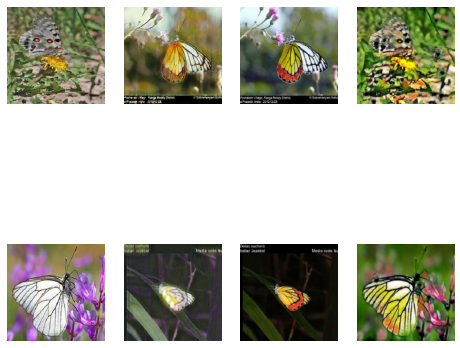

Epoch 49/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1545 - BA_loss: 2.4178 - Disc_A_loss: 0.1257 - Disc_B_loss: 0.1785


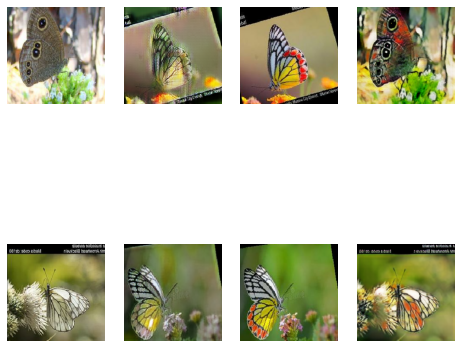

Epoch 50/50
232/232 [==============================] - 200s 863ms/step - AB_loss: 3.1235 - BA_loss: 2.4245 - Disc_A_loss: 0.1279 - Disc_B_loss: 0.1816


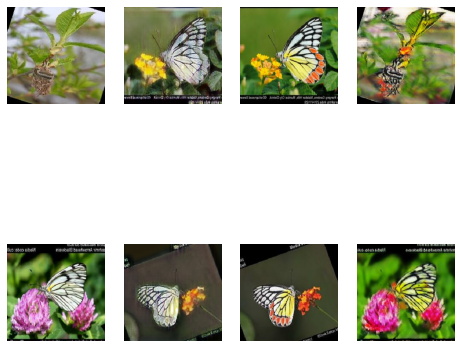

In [ ]:
cyclegan_model.fit(
    tf.data.Dataset.zip((trainA_dataset, trainB_dataset)),
    epochs=50,
    callbacks=[model_checkpoint_callback, plotter],
    )

### Train History

1. 80 эпох lr=2e-4
2. 20 эпох lr=2e-4
3. 50 эпох Linear decay

Результат из цветной бабочки в белую думаю получился хорошим, но из белой в цветную не очень. Не знаю с чем это связано.

При достаточно долгом обучений из Белых в Цветных начали появлятся артефакты. Генератор вставлял узоры напоминающие кончики крыльев цветных бабочек в совершенно ненужные места. Или генератор переобучился к дискриминатору. К сожалению точного вывода пока сделать не могу, т.к. не успел по дедлайнам.

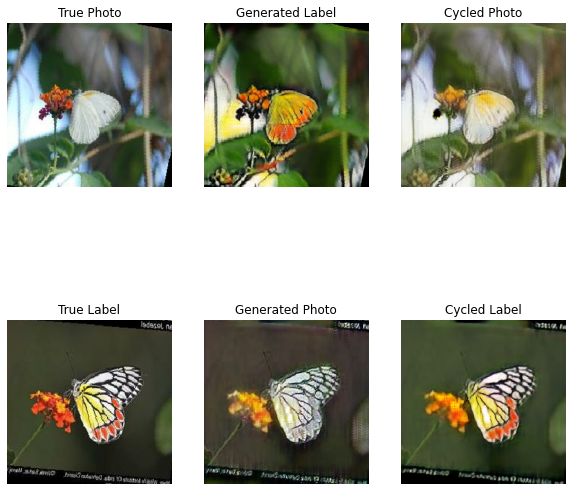

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(10, 10))
samples = next(iter(tf.data.Dataset.zip((testA_dataset, testB_dataset))))

label, real  = samples[1], samples[0]
gen_label = cyclegan_model.g_AB(real)
gen_real = cyclegan_model.g_BA(label)
cycle_real = cyclegan_model.g_BA(gen_label)
cycle_label = cyclegan_model.g_AB(gen_real)
label = (((label[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
gen_label = (((gen_label[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
real = (((real[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
gen_real = (((gen_real[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
cycle_label = (((cycle_label[0] * 127.5) + 127.5).numpy()).astype(np.uint8)
cycle_real = (((cycle_real[0] * 127.5) + 127.5).numpy()).astype(np.uint8)

ax[0, 0].imshow(real)
ax[0, 1].imshow(gen_label)
ax[0, 2].imshow(cycle_real)
ax[0, 0].set_title("True Photo")
ax[0, 1].set_title("Generated Label")
ax[0, 2].set_title("Cycled Photo")

ax[1, 0].imshow(label)
ax[1, 1].imshow(gen_real)
ax[1, 2].imshow(cycle_label)
ax[1, 0].set_title("True Label")
ax[1, 1].set_title("Generated Photo")
ax[1, 2].set_title("Cycled Label")

for a in ax.flat:
  a.axis("off")
plt.show()